In [691]:
install.packages("astsa")
install.packages("xts")
install.packages("tsbox")
install.packages("forecast")

In [1848]:
library("astsa")
library("ggplot2")
library("xts")
library("tsbox")
library("tseries")
library("dplyr")

In [1849]:
taxis <- read.csv("CleanData.csv")
aug_data <- read.csv("./augmented_data.csv")

In [1850]:
set_plot_dimensions <- function(width_choice, height_choice) {
        options(repr.plot.width=width_choice, repr.plot.height=height_choice)
        }

In [1851]:
typeof(taxis)

[1] "list"

In [1852]:
cat("No. of days: From 2017 - 2019: ", nrow(taxis), "\n")
cat("No. of features: ", ncol(taxis))

No. of days: From 2017 - 2019:  1095 
No. of features:  3

In [1853]:
head(taxis)

,X,tpep_pickup_datetime,passenger_count
,<int>,<chr>,<dbl>
1,0,2017-01-01,492666
2,1,2017-01-02,382771
3,2,2017-01-03,452785
4,3,2017-01-04,468784
5,4,2017-01-05,522893
6,5,2017-01-06,555502


In [1854]:
head(aug_data)

,X,tpep_pickup_datetime,passenger_count,year,month,date,weekday,month_date,labels_365,labels_182,labels_45,labels_30
,<int>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>
1,0,2017-01-01,492666,2017,1,1,7,Jan-1,1,1,1,1
2,1,2017-01-02,382771,2017,1,2,1,Jan-2,2,2,2,2
3,2,2017-01-03,452785,2017,1,3,2,Jan-3,3,3,3,3
4,3,2017-01-04,468784,2017,1,4,3,Jan-4,4,4,4,4
5,4,2017-01-05,522893,2017,1,5,4,Jan-5,5,5,5,5
6,5,2017-01-06,555502,2017,1,6,5,Jan-6,6,6,6,6


In [1855]:
taxis$tpep_pickup_datetime <- as.Date(taxis$tpep_pickup_datetime, "20%y-%m-%d")
aug_data$tpep_pickup_datetime <- as.Date(aug_data$tpep_pickup_datetime, "20%y-%m-%d")

In [1856]:
keeps <- c("tpep_pickup_datetime","passenger_count")
taxis <- taxis[keeps]

In [1857]:
fullData = taxis
fullDates = taxis$tpep_pickup_datetime
fullCounts = taxis$passenger_count

#### Plotting full data with test segregation

In [1858]:
test_count = 60

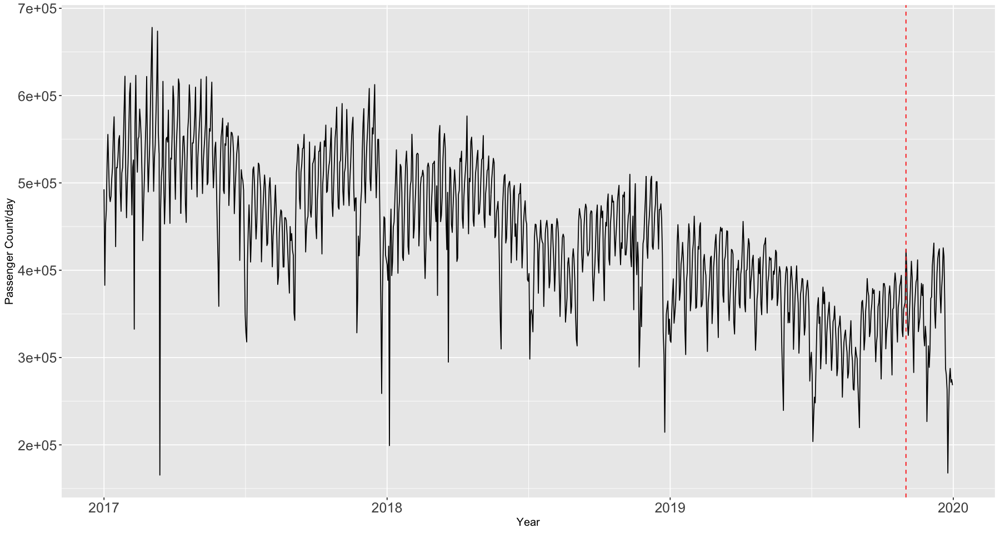

In [1859]:
set_plot_dimensions(15, 8)
p <- ggplot(taxis, aes(x=tpep_pickup_datetime, y=passenger_count)) + geom_line() + 
     theme(axis.text = element_text(size = 15)) +
     theme(text = element_text(size = 12)) +
     labs(y = "Passenger Count/day", x = "Year")

p + geom_vline(xintercept = fullDates[(length(fullDates) - test_count)], linetype="dashed", 
                color = "red", size=0.5)

##### Taking last 60 days of data on hold for testing later

In [1860]:
trainData = head(taxis, (nrow(fullData) - test_count))
train_x = trainData$tpep_pickup_datetime
train_y = trainData$passenger_count

augtrainData = head(aug_data, (nrow(fullData) - test_count))

In [1861]:
train_years = augtrainData$year
train_months = augtrainData$month
train_weekday = augtrainData$weekday
train_labels_365 = augtrainData$labels_365
train_labels_182 = augtrainData$labels_182
train_labels_45 = augtrainData$labels_45
train_labels_30 = augtrainData$labels_30

In [1862]:
### Full data

full_x = fullData$tpep_pickup_datetime
full_y = fullData$passenger_count
n_full = nrow(fullData)

##Attributes
full_years = aug_data$year
full_months = aug_data$month
full_weekday = aug_data$weekday
full_labels_365 = aug_data$labels_365
full_labels_182 = aug_data$labels_182
full_labels_45 = aug_data$labels_45
full_labels_30 = aug_data$labels_30

In [1863]:
n = nrow(trainData)

In [1864]:
lmfit <- lm(train_y~time(train_x), na.action=NULL)
summary(lmfit)


Call:
lm(formula = train_y ~ time(train_x), na.action = NULL)

Residuals:
    Min      1Q  Median      3Q     Max 
-367333  -30979    5849   37428  143288 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   547356.006   3401.829  160.90   <2e-16 ***
time(train_x)   -200.138      5.689  -35.18   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 54680 on 1033 degrees of freedom
Multiple R-squared:  0.5451,	Adjusted R-squared:  0.5446 
F-statistic:  1238 on 1 and 1033 DF,  p-value: < 2.2e-16


In [1865]:
adf.test(fullData$passenger_count)

Warning message in adf.test(fullData$passenger_count):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  fullData$passenger_count
Dickey-Fuller = -6.9788, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


### Exploratory data analysis

`geom_smooth()` using formula 'y ~ x'



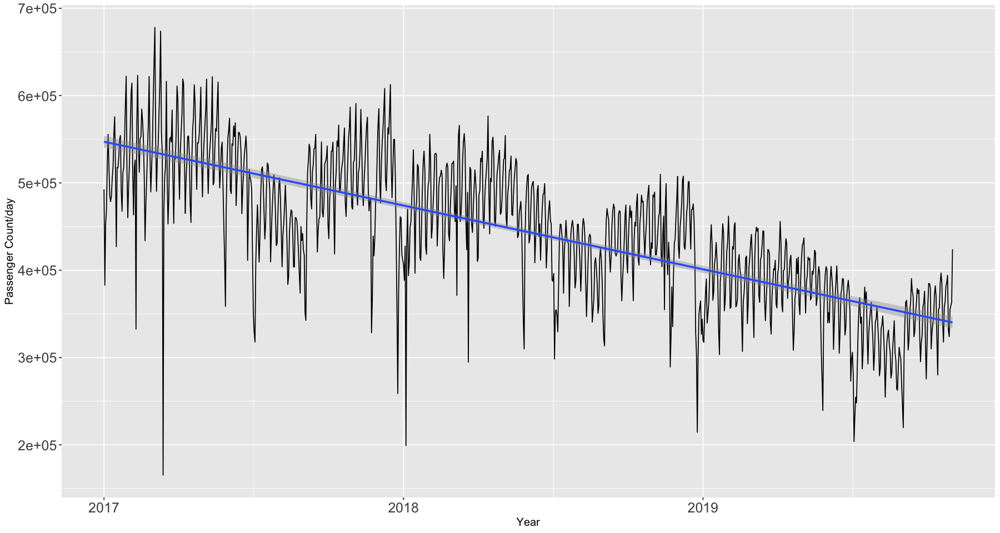

In [1866]:
set_plot_dimensions(15, 8)
p <- ggplot(trainData, aes(x=tpep_pickup_datetime, y=passenger_count)) + geom_line() +
     theme(axis.text = element_text(size = 15)) +
     geom_smooth(method = "lm") +
     theme(text = element_text(size = 12)) +
     labs(y = "Passenger Count/day", x = "Year")

p

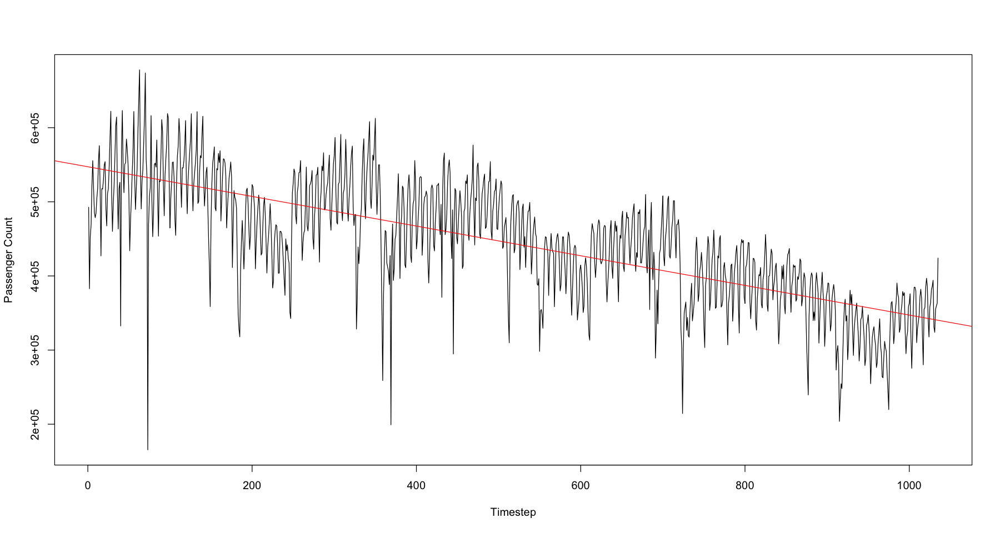

In [1867]:
# Using normal abline
plot(time(train_x), train_y, xlab = "Timestep", ylab = "Passenger Count", type = 'l')
abline(lmfit, col = 'red')

##### Sample ACF and PACF for original series

In [1868]:
## ACF shows there is long term cyclic trend in data.
## PACF significant till ~35 days and is cyclic
## ACF looks like tailing off but in a cyclic manner.
## PACF seems to cut off at lag 1, though it increases later but we would like to model always simple models
## Looks like AR(1) => xt = xt-1 + wt

#https://towardsdatascience.com/how-to-detect-random-walk-and-white-noise-in-time-series-forecasting-bdb5bbd4ef81

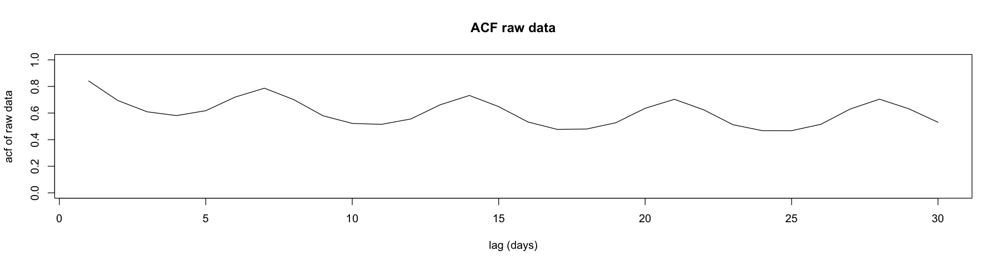

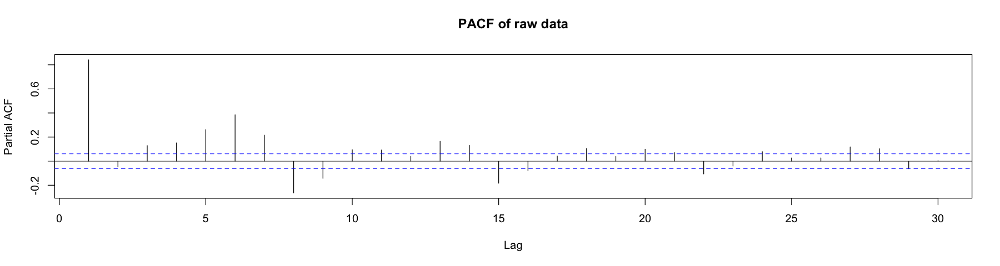

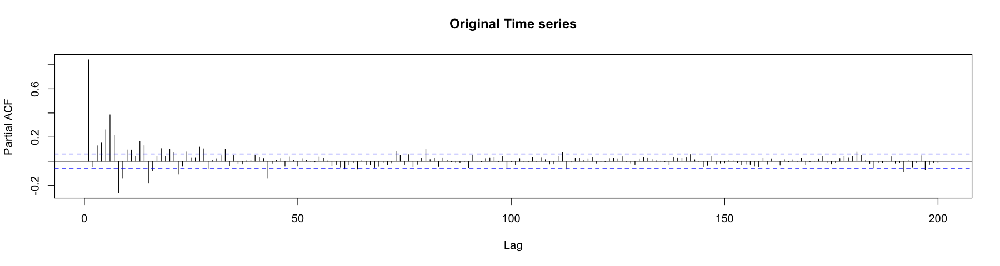

In [1869]:
set_plot_dimensions(15, 4)
a = acf(train_y, plot=F) 
plot(a$lag[2:31], a$acf[2:31], type="l", xlab="lag (days)", ylab="acf of raw data", ylim=c(0,1), main = "ACF raw data") 
b = pacf(train_y, main="PACF of raw data") ## the default is good for pacf.

pacf(train_y, 200, main = "Original Time series")

In [1646]:
adf.test(train_y)

## Accept the null hypothesis that it is not stationary

Warning message in adf.test(train_y):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  train_y
Dickey-Fuller = -6.6508, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


In [1647]:
# set_plot_dimensions(15, 10)
# par(mfrow = c(2,1))
# acf(fullData$passenger_count, 450, main = "Original Time series")
# pacf(fullData$passenger_count, 200, main = "Original Time series")

##### Detrending

In [1648]:
linear_coef = lmfit$coefficients
linear_residuals = lmfit$residuals

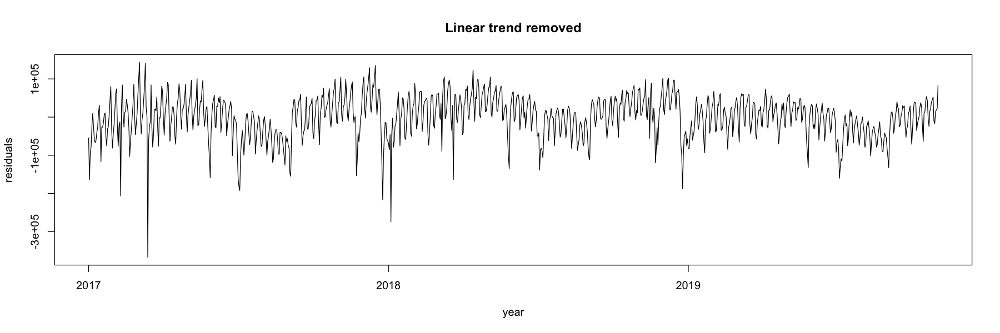

In [1649]:
set_plot_dimensions(15, 5)
plot(train_x, linear_residuals, type = 'l', xlab = "year", ylab = "residuals", main = "Linear trend removed")

## Looking very noisy, not continuous, very close to white noise.
## Not quite Stationary hard to tell.
## Values are not linear

In [1650]:
### Checking the acf and pacf of residuals to confirm if it is random walk with drift and also if now it's stationary

In [1651]:
adf.test(linear_residuals)

## Accept the null hypothesis that it is not stationary. Still it's not stationary

Warning message in adf.test(linear_residuals):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  linear_residuals
Dickey-Fuller = -6.6508, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


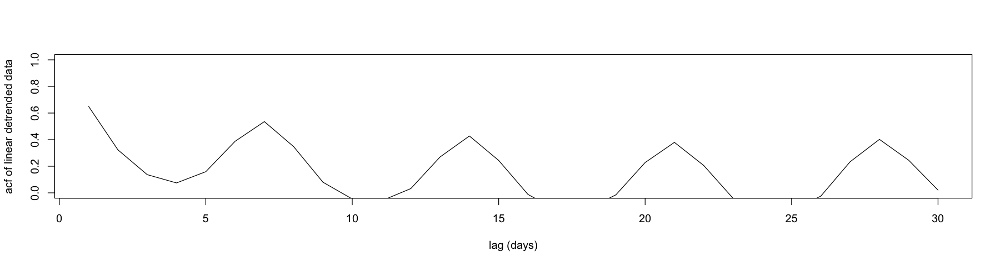

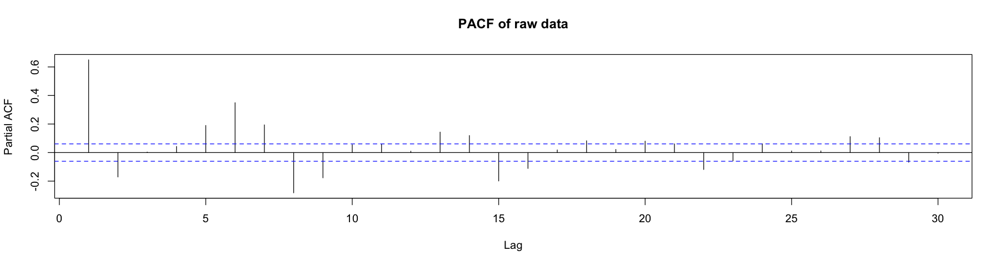

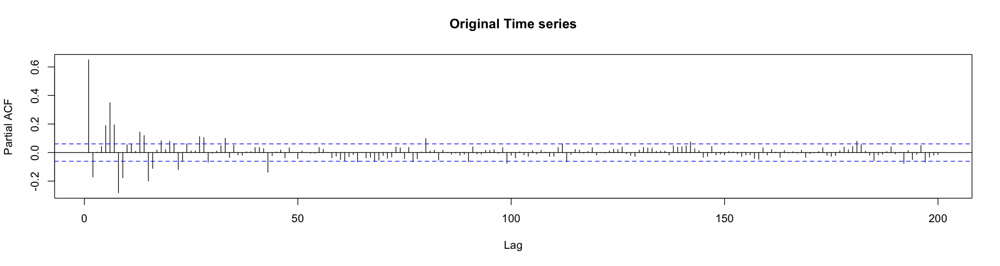

In [1652]:
set_plot_dimensions(15, 4)
a = acf(linear_residuals, plot=F) 
plot(a$lag[2:31], a$acf[2:31], type="l", xlab="lag (days)", ylab="acf of linear detrended data", ylim=c(0,1)) 
b = pacf(linear_residuals, main="PACF of raw data") ## the default is good for pacf.

pacf(linear_residuals, 200, main = "Original Time series")

### Not stationary, acf tailing off and PACF cuts off at lag 2. Looks like linearly detrended series is a AR(2)

### Checking for cycles using frequency analysis

In [1653]:
### The residual series still proves to be not stationary therefore removing the suspected weekly, and yearly trends

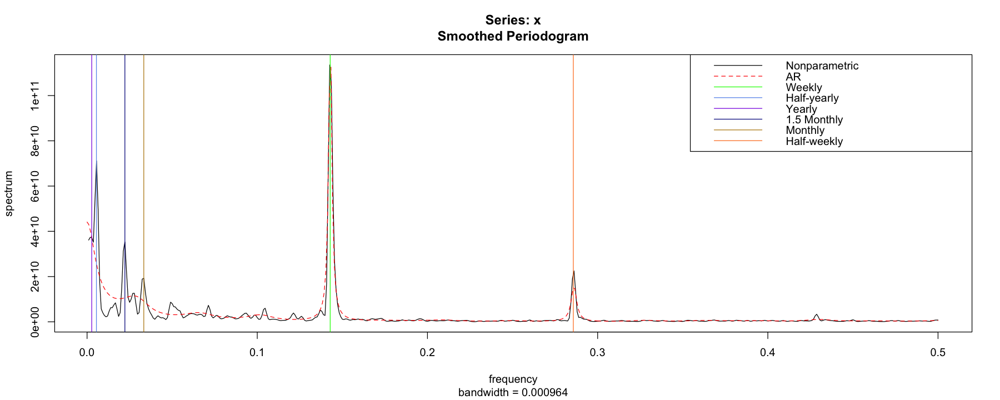

In [1654]:
## AR Spectrum. Parametric spectral estimation. Fits best fitting pure AR model.

set_plot_dimensions(15, 6)
spectrum(linear_residuals, log = "no", spans = c(3, 3), lty = 1)
spectrum(linear_residuals, method = "ar", add = T, lty = 2, col = 'red')

abline(v = (1/7), col = "green")
abline(v = (1/3.5), col = "chocolate1")
abline(v = (1/30), col = "darkgoldenrod")
abline(v = (1/45), col = "darkblue")
abline(v = (1/182), col = "cornflowerblue")
abline(v = (1/365), col = "blueviolet")

legend("topright", c("Nonparametric", "AR", "Weekly", "Half-yearly", "Yearly", "1.5 Monthly",
                    "Monthly", "Half-weekly"), lty=c(1, 2, 1, 1, 1, 1, 1), 
       col = c("black", "red", "green", "cornflowerblue", "blueviolet", "darkblue", "darkgoldenrod", "chocolate1")
      )

In [1655]:
### Above shows there are low frequency cycles i.e. there are long span cycles. Also there are 3 major cycles visible.
## Time period = 1 / f

##### No. of prominent cycles found = 5. Sorted by effect:
- Weekly (1 / 7) (Green)
- Half-yearly (1 / 182) (cornflowerblue)
- Yearly (1 / 365) (blueviolet)
- 1.5 Monthly (1 / 45) (darkblue)
- Monthly (1 / 30) (darkgoldenrod)
- Half-weekly (1 / 3.5) (chocolate1)

##### Removing the biggest contributing cycle first i.e the weekly cycle.
- Will remove the most obvious cycles starting from less periods to more and hope that bigger cycles will be removed.
- Gives more granularity and not changes the large period cycles.

In [1656]:
### Calculating the means in Python pandas as it's simple there. 

In [1657]:
trainData['linear_residuals'] = linear_residuals

In [1658]:
residualDF = data.frame(linear_residuals)
residualDF['weekday'] = train_weekday

In [1659]:
resid_group_weekday = residualDF %>% group_by(weekday)  %>%
                    summarise(mean_per_weekday = mean(linear_residuals),
                              n_weekday = length(linear_residuals),
                              .groups = 'drop')

resid_group_weekday['dayname'] = c("Mon", "Tue", "Wed", "Thur", "Fri", "Sat", "Sun")

In [1660]:
resid_group_weekday

weekday,mean_per_weekday,n_weekday,dayname
<int>,<dbl>,<int>,<chr>
1,-44983.932,148,Mon
2,-9319.261,148,Tue
3,8828.174,148,Wed
4,21630.582,148,Thur
5,31223.409,148,Fri
6,28864.492,147,Sat
7,-36048.435,148,Sun


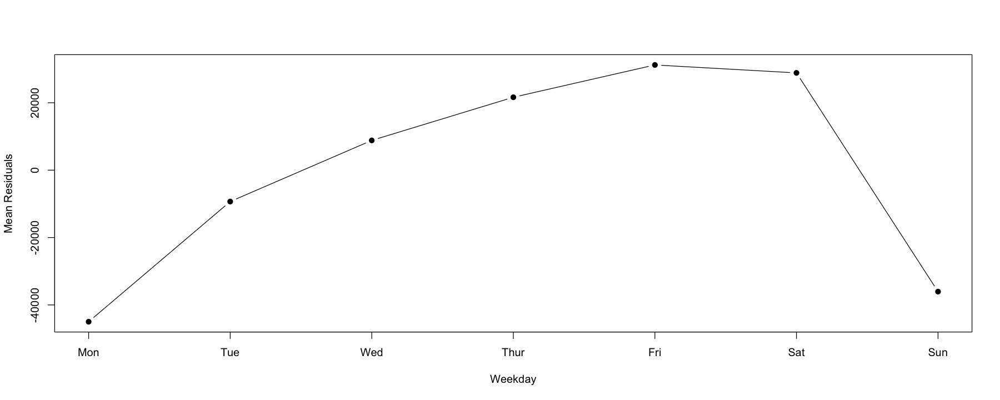

In [1661]:
set_plot_dimensions(15, 6)

plot(resid_group_weekday$weekday, resid_group_weekday$mean_per_weekday, xaxt='n', type = 'b', pch = 19,
    xlab = "Weekday", ylab = "Mean Residuals")
axis(1, at=1:7, labels=resid_group_weekday$dayname)

In [1662]:
## Removing mean weekday residuals
temp = rep(0, n)

for(i in c(1 : n)) {
    day = residualDF[i, ]$weekday
    temp[i] = residualDF[i, ]$linear_residuals - resid_group_weekday[day,]$mean_per_weekday
}

residualDF['linear_residuals'] = temp

In [1663]:
trainData['resid_weekly_removed'] = temp

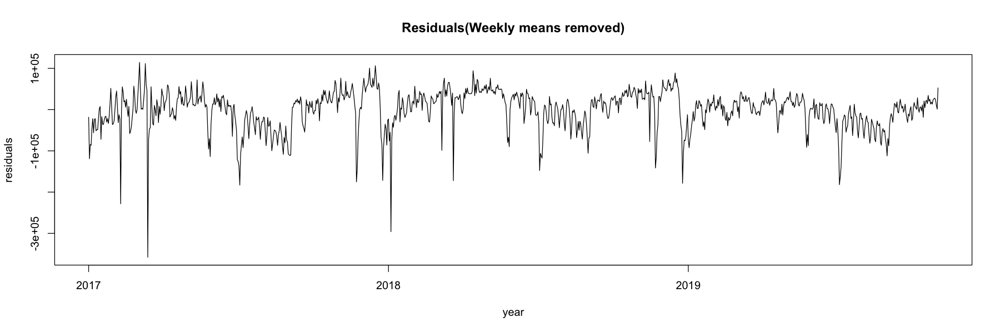

In [1664]:
set_plot_dimensions(15, 5)
plot(train_x, residualDF[['linear_residuals']], type = 'l', xlab = "year", ylab = "residuals", main = "Residuals(Weekly means removed)")


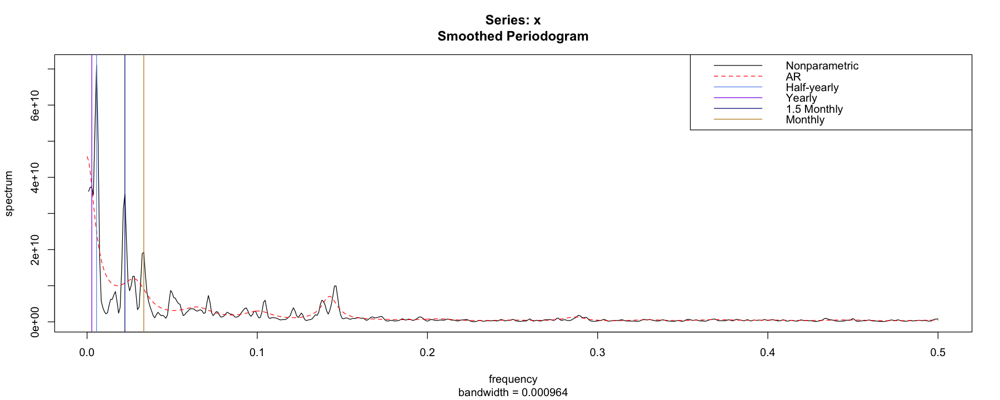

In [1665]:
### Seeing the spectrum again

set_plot_dimensions(15, 6)
spectrum(residualDF[['linear_residuals']], log = "no", spans = c(3, 3), lty = 1)
spectrum(residualDF[['linear_residuals']], method = "ar", add = T, lty = 2, col = 'red')

abline(v = (1/30), col = "darkgoldenrod")
abline(v = (1/45), col = "darkblue")
abline(v = (1/180), col = "cornflowerblue")
abline(v = (1/360), col = "blueviolet")

legend("topright", c("Nonparametric", "AR", "Half-yearly", "Yearly", "1.5 Monthly",
                    "Monthly"), lty=c(1, 2, 1, 1, 1, 1, 1), 
       col = c("black", "red", "cornflowerblue", "blueviolet", "darkblue", "darkgoldenrod")
      )

In [1666]:
### Removing the weekly cycle from residuals also suppresses the half-weekly cycle

In [1667]:
adf.test(residualDF[['linear_residuals']])

Warning message in adf.test(residualDF[["linear_residuals"]]):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  residualDF[["linear_residuals"]]
Dickey-Fuller = -6.3899, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


#### Removing other prominent cycles:  30 day cycles

In [1669]:
residualDF['train_labels_30'] = train_labels_30

In [1670]:
resid_group_30 = residualDF %>% group_by(train_labels_30)  %>%
                    summarise(mean_per_30 = mean(linear_residuals),
                              n_30 = length(linear_residuals),
                              .groups = 'drop')

In [1671]:
head(resid_group_30)

train_labels_30,mean_per_30,n_30
<int>,<dbl>,<int>
1,-2469.6053,35
2,-7730.6502,34
3,-5125.3829,34
4,-17182.8680,34
5,512.5074,34
6,4324.4413,34


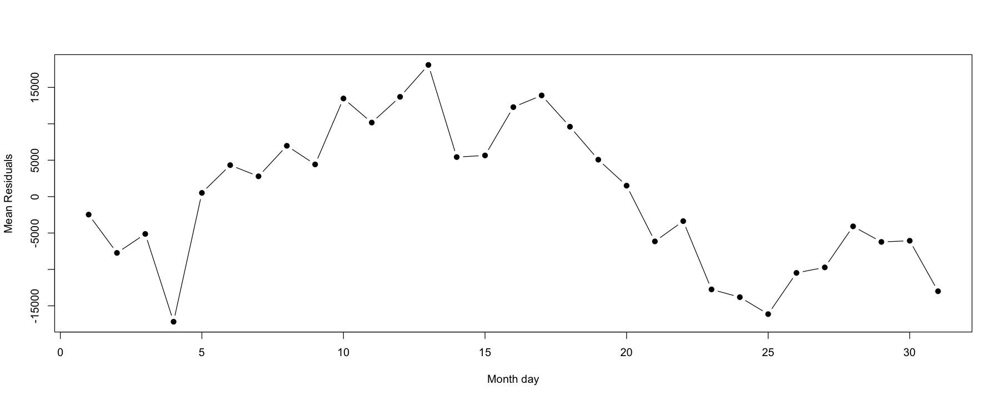

In [1672]:
set_plot_dimensions(15, 6)

plot(resid_group_30$train_labels_30, resid_group_30$mean_per_30, type = 'b', pch = 19,
    xlab = "Month day", ylab = "Mean Residuals")

In [1673]:
## Removing mean monthly residuals
temp = rep(0, n)

for(i in c(1 : n)) {
    day = residualDF[i, ]$train_labels_30
    temp[i] = residualDF[i, ]$linear_residuals - resid_group_30[day,]$mean_per_30
}

residualDF['linear_residuals'] = temp
trainData['resid_monthly_removed'] = temp

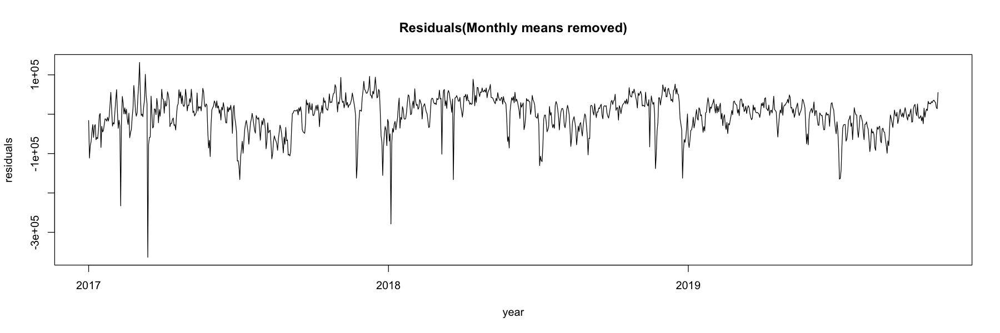

In [1674]:
# Visualising residuals after removing monthly cycles
set_plot_dimensions(15, 5)
plot(train_x, residualDF[['linear_residuals']], type = 'l', xlab = "year", ylab = "residuals", main = "Residuals(Monthly means removed)")


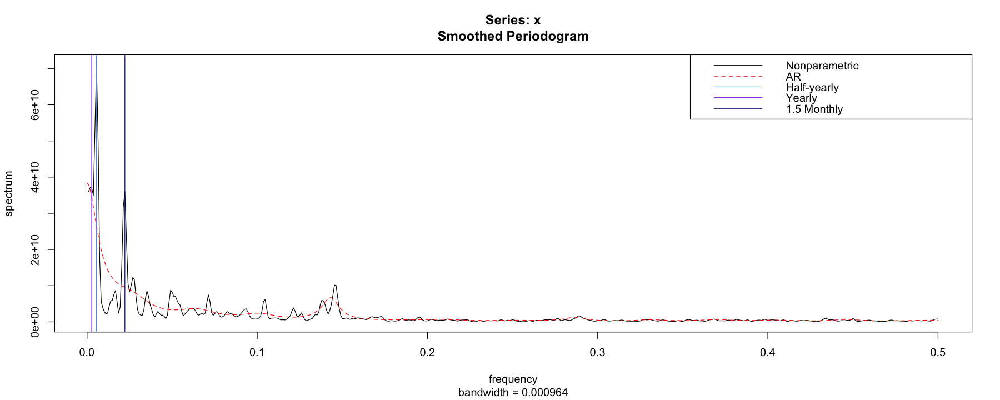

In [1675]:
### Seeing the spectrum again

set_plot_dimensions(15, 6)
spectrum(residualDF[['linear_residuals']], log = "no", spans = c(3, 3), lty = 1)
spectrum(residualDF[['linear_residuals']], method = "ar", add = T, lty = 2, col = 'red')

abline(v = (1/45), col = "darkblue")
abline(v = (1/182), col = "cornflowerblue")
abline(v = (1/365), col = "blueviolet")

legend("topright", c("Nonparametric", "AR", "Half-yearly", "Yearly", "1.5 Monthly"), lty=c(1, 2, 1, 1, 1), 
       col = c("black", "red", "cornflowerblue", "blueviolet", "darkblue")
      )

In [1676]:
adf.test(residualDF[['linear_residuals']])

Warning message in adf.test(residualDF[["linear_residuals"]]):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  residualDF[["linear_residuals"]]
Dickey-Fuller = -6.102, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


#### Removing 45 day cycles

In [1677]:
residualDF['train_labels_45'] = train_labels_45


resid_group_45 = residualDF %>% group_by(train_labels_45)  %>%
                    summarise(mean_per_45 = mean(linear_residuals),
                              n_45 = length(linear_residuals),
                              .groups = 'drop')

head(resid_group_45)

train_labels_45,mean_per_45,n_45
<int>,<dbl>,<int>
1,3473.075,23
2,-5599.697,23
3,-11995.348,23
4,-14111.315,23
5,-7213.305,23
6,-9798.605,23


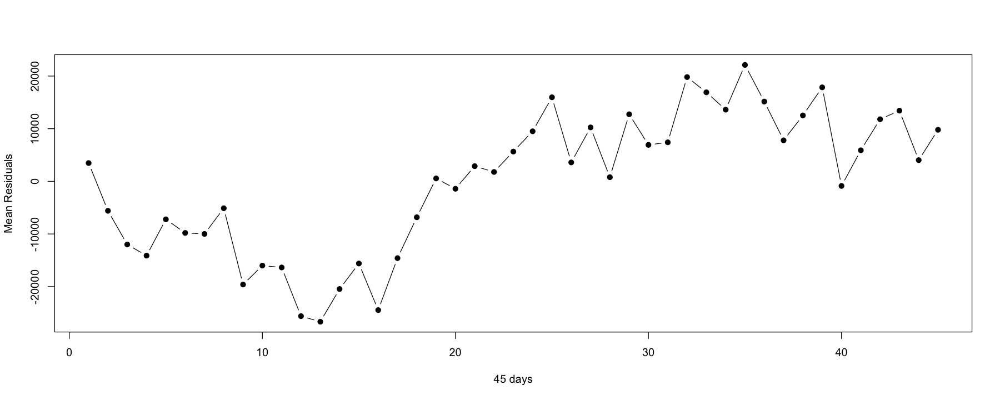

In [1678]:
set_plot_dimensions(15, 6)

plot(resid_group_45$train_labels_45, resid_group_45$mean_per_45, type = 'b', pch = 19,
    xlab = "45 days", ylab = "Mean Residuals")

In [1679]:
## Removing mean 45 day residuals
temp = rep(0, n)

for(i in c(1 : n)) {
    day = residualDF[i, ]$train_labels_45
    temp[i] = residualDF[i, ]$linear_residuals - resid_group_45[day,]$mean_per_45
}

residualDF['linear_residuals'] = temp
trainData['resid_45day_removed'] = temp

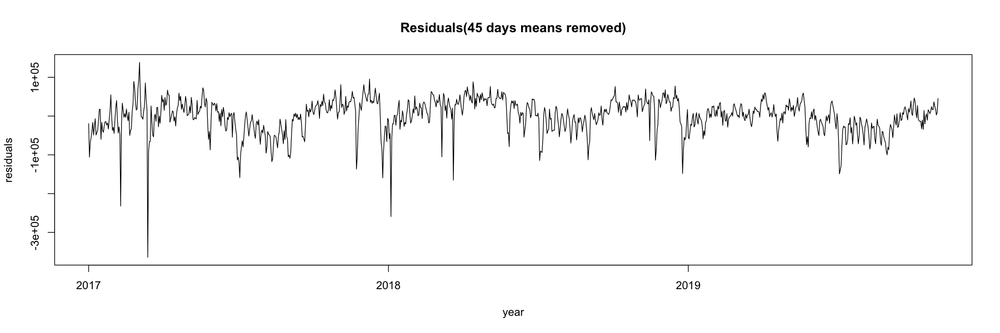

In [1680]:
# Visualising residuals after removing 45 days cycles
set_plot_dimensions(15, 5)
plot(train_x, residualDF[['linear_residuals']], type = 'l', xlab = "year", ylab = "residuals", main = "Residuals(45 days means removed)")


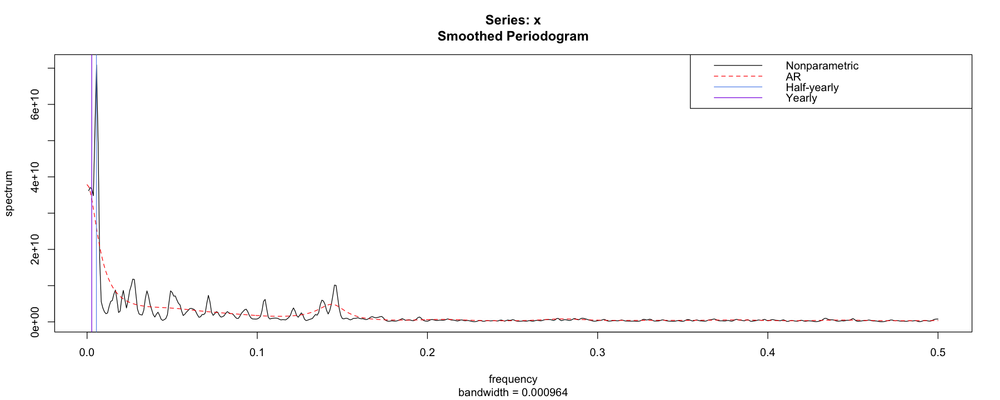

In [1681]:
### Seeing the spectrum again

set_plot_dimensions(15, 6)
spectrum(residualDF[['linear_residuals']], log = "no", spans = c(3, 3), lty = 1)
spectrum(residualDF[['linear_residuals']], method = "ar", add = T, lty = 2, col = 'red')

abline(v = (1/182), col = "cornflowerblue")
abline(v = (1/365), col = "blueviolet")

legend("topright", c("Nonparametric", "AR", "Half-yearly", "Yearly"), lty=c(1, 2, 1, 1, 1), 
       col = c("black", "red", "cornflowerblue", "blueviolet")
      )

In [1682]:
adf.test(residualDF[['linear_residuals']])

Warning message in adf.test(residualDF[["linear_residuals"]]):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  residualDF[["linear_residuals"]]
Dickey-Fuller = -5.8681, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


#### Removing half yearly cycles

In [1683]:
residualDF['train_labels_182'] = train_labels_182


resid_group_182 = residualDF %>% group_by(train_labels_182)  %>%
                    summarise(mean_per_182 = mean(linear_residuals),
                              n_182 = length(linear_residuals),
                              .groups = 'drop')

head(resid_group_182)

train_labels_182,mean_per_182,n_182
<int>,<dbl>,<int>
1,-29699.20,6
2,-33970.56,6
3,-59990.54,6
4,-73320.80,6
5,-109350.59,6
6,-64950.04,6


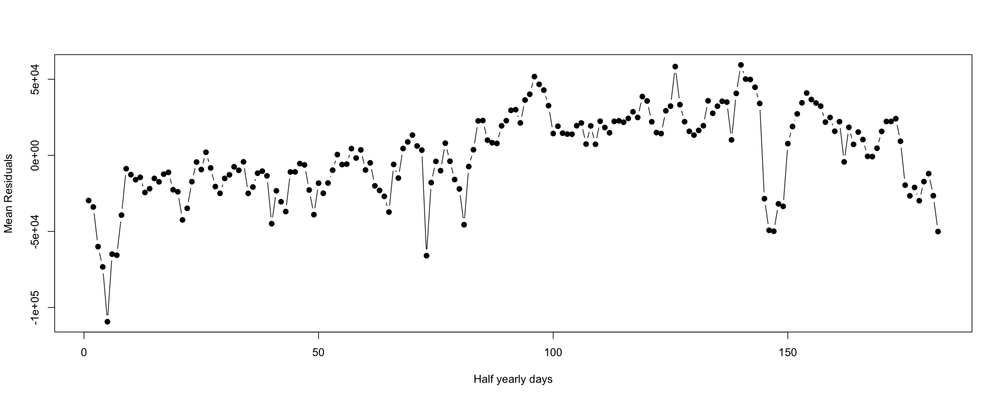

In [1684]:
set_plot_dimensions(15, 6)

plot(resid_group_182$train_labels_182, resid_group_182$mean_per_182, type = 'b', pch = 19,
    xlab = "Half yearly days", ylab = "Mean Residuals")

In [1685]:
## Removing mean half yearly residuals
temp = rep(0, n)

for(i in c(1 : n)) {
    day = residualDF[i, ]$train_labels_182
    temp[i] = residualDF[i, ]$linear_residuals - resid_group_182[day,]$mean_per_182
}

residualDF['linear_residuals'] = temp
trainData['resid_182day_removed'] = temp

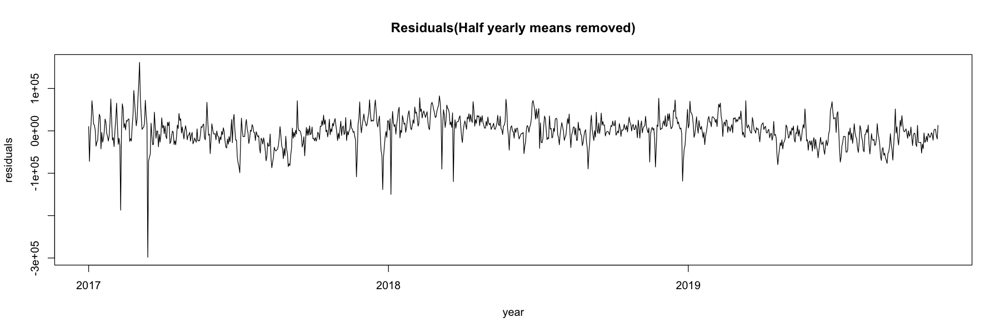

In [1686]:
# Visualising residuals after removing half yearly cycles
set_plot_dimensions(15, 5)
plot(train_x, residualDF[['linear_residuals']], type = 'l', xlab = "year", ylab = "residuals", main = "Residuals(Half yearly means removed)")


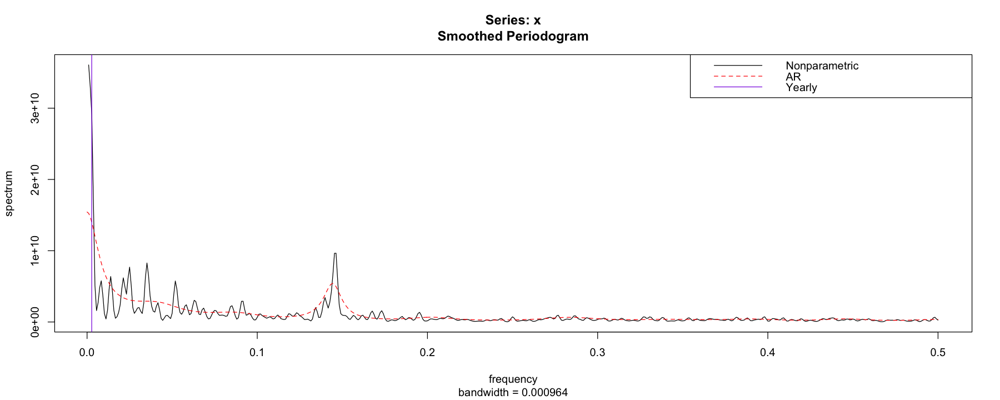

In [1687]:
### Seeing the spectrum again

set_plot_dimensions(15, 6)
spectrum(residualDF[['linear_residuals']], log = "no", spans = c(3, 3), lty = 1)
spectrum(residualDF[['linear_residuals']], method = "ar", add = T, lty = 2, col = 'red')

abline(v = (1/365), col = "blueviolet")

legend("topright", c("Nonparametric", "AR", "Yearly"), lty=c(1, 2, 1, 1), 
       col = c("black", "red", "blueviolet")
      )

In [1688]:
adf.test(residualDF[['linear_residuals']])

Warning message in adf.test(residualDF[["linear_residuals"]]):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  residualDF[["linear_residuals"]]
Dickey-Fuller = -6.8704, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


#### Removing yearly cycles

In [1689]:
residualDF['train_labels_365'] = train_labels_365


resid_group_365 = residualDF %>% group_by(train_labels_365)  %>%
                    summarise(mean_per_365 = mean(linear_residuals),
                              n_365 = length(linear_residuals),
                              .groups = 'drop')

head(resid_group_365)

train_labels_365,mean_per_365,n_365
<int>,<dbl>,<int>
1,13524.45,3
2,-18638.86,3
3,30277.89,3
4,-29299.09,3
5,39972.24,3
6,43033.54,3


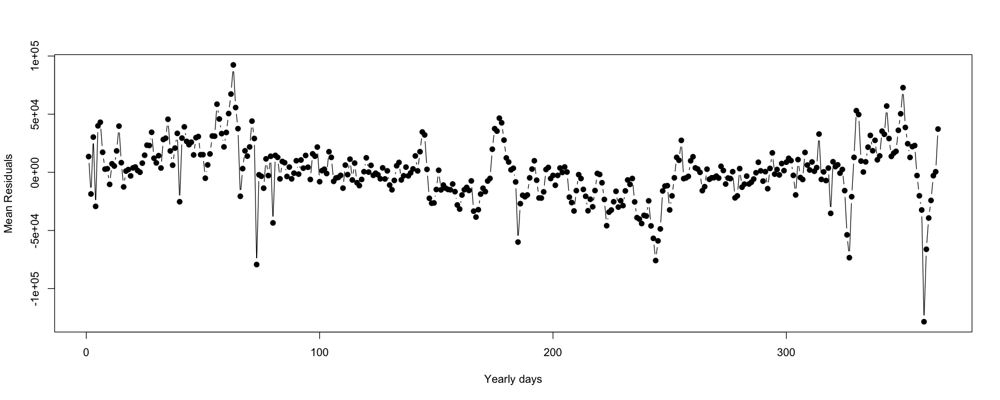

In [1690]:
set_plot_dimensions(15, 6)

plot(resid_group_365$train_labels_365, resid_group_365$mean_per_365, type = 'b', pch = 19,
    xlab = "Yearly days", ylab = "Mean Residuals")

In [1691]:
## Removing mean half yearly residuals
temp = rep(0, n)

for(i in c(1 : n)) {
    day = residualDF[i, ]$train_labels_365
    temp[i] = residualDF[i, ]$linear_residuals - resid_group_365[day,]$mean_per_365
}

residualDF['linear_residuals'] = temp
trainData['resid_365day_removed'] = temp

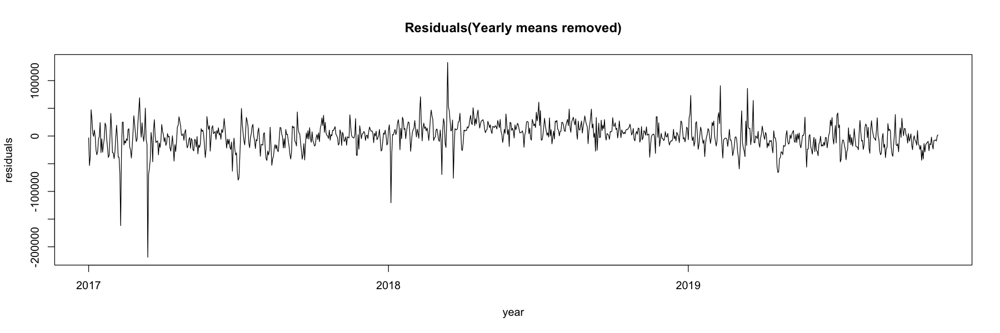

In [1692]:
# Visualising residuals after removing half yearly cycles
set_plot_dimensions(15, 5)
plot(train_x, residualDF[['linear_residuals']], type = 'l', xlab = "year", ylab = "residuals", main = "Residuals(Yearly means removed)")


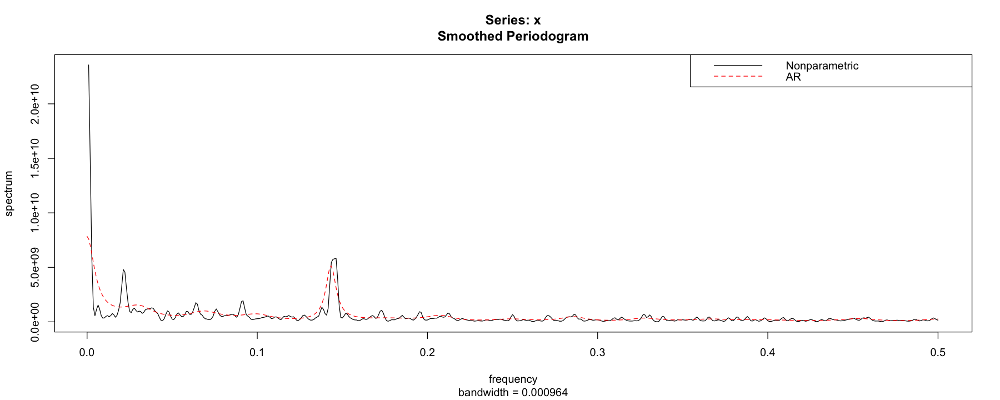

In [1693]:
### Seeing the spectrum again

set_plot_dimensions(15, 6)
spectrum(residualDF[['linear_residuals']], log = "no", spans = c(3, 3), lty = 1)
spectrum(residualDF[['linear_residuals']], method = "ar", add = T, lty = 2, col = 'red')

legend("topright", c("Nonparametric", "AR"), lty=c(1, 2, 1), 
       col = c("black", "red")
      )

In [1694]:
adf.test(residualDF[['linear_residuals']])

Warning message in adf.test(residualDF[["linear_residuals"]]):
“p-value smaller than printed p-value”



	Augmented Dickey-Fuller Test

data:  residualDF[["linear_residuals"]]
Dickey-Fuller = -6.9287, Lag order = 10, p-value = 0.01
alternative hypothesis: stationary


### Finding best arima that fits final residuals

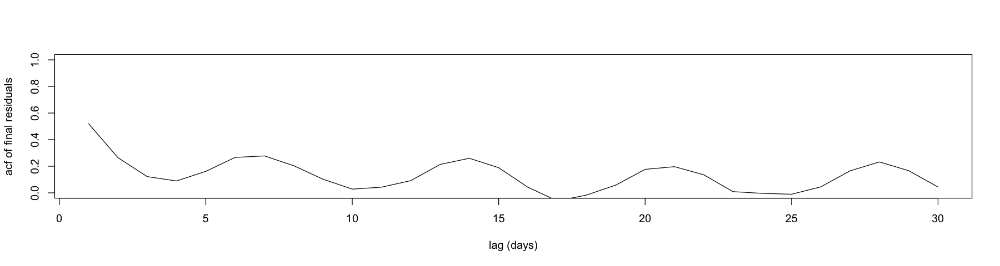

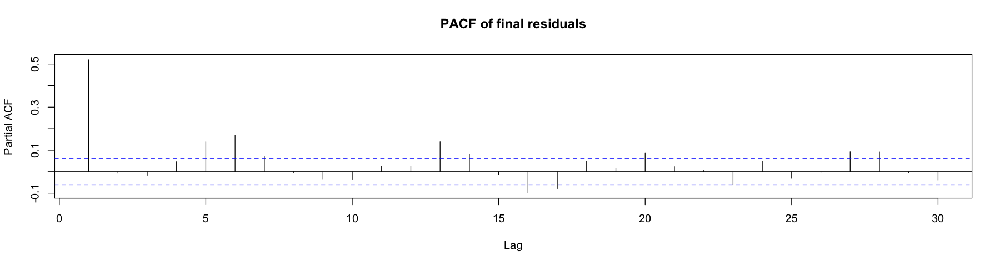

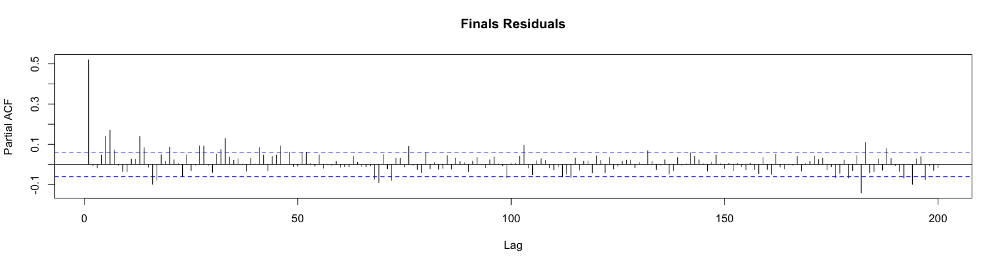

In [1695]:
set_plot_dimensions(15, 4)
a = acf(residualDF[['linear_residuals']], plot=F) 
plot(a$lag[2:31], a$acf[2:31], type="l", xlab="lag (days)", ylab="acf of final residuals", ylim=c(0,1)) 
b = pacf(residualDF[['linear_residuals']], main="PACF of final residuals")

pacf(residualDF[['linear_residuals']], 200, main = "Finals Residuals")

### Not stationary, acf tailing off and PACF cuts off at lag 2. Looks like linearly detrended series is a AR(2)

###### Looks like AR(1). ACF tailing off and PACF cutting off after lag 1

In [1696]:
### Looking at suspected AR(1) model

a1 = sarima(residualDF[['linear_residuals']], p=1, q=0, d=0, details=FALSE) 
cat("AIC: ", a1$AIC, "\n")
cat("BIC: ", a1$BIC)

AIC:  22.66863 
BIC:  22.68296

In [1697]:
aics = matrix(0, ncol=10, nrow=10)
bics = matrix(0, ncol=10, nrow=10)

for(i in c(1: 10)){
    for(j in c(1: 10)){
        mod = sarima(residualDF[['linear_residuals']], p=i-1, q=j-1, d=0, details=FALSE)
        aics[i,j] = mod$AIC
        bics[i,j] = mod$BIC
}}

Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in arima(xdata, order = c(p, d, q), seasonal = list(order = c(P, :
“possible convergence problem: optim gave code = 1”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in arima(xdata, order = c(p, d, q), seasonal = list(order = c(P, :
“possible convergence problem: optim gave code = 1”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$va

In [1698]:
scores = (2*aics*bics) / (aics + bics)

In [1873]:
aics[10, 10]

[1] 22.55706

In [1872]:
bics[6, 4]

[1] 22.55096

In [1320]:
write.csv(aics, "./aics.csv")
write.csv(scores, "./scores.csv")

In [1699]:
## Finding best model based on AIC only
which(aics == min(aics), arr.ind=TRUE)

row,col
9,9


In [1700]:
## Finding best model based on AIC and BIC combined
which(scores == min(scores), arr.ind=TRUE)

row,col
6,4


#### Models to try:

- ARMA(1, 0)
- ARMA(9, 9)
- ARMA(6, 4)

### First model ARMA (9, 9)

initial  value 10.067443 
iter   2 value 9.926153
iter   3 value 9.893618
iter   4 value 9.880754
iter   5 value 9.878860
iter   6 value 9.877485
iter   7 value 9.872234
iter   8 value 9.867375
iter   9 value 9.865559
iter  10 value 9.862671
iter  11 value 9.862104
iter  12 value 9.858550
iter  13 value 9.857257
iter  14 value 9.856688
iter  15 value 9.856345
iter  16 value 9.855900
iter  17 value 9.855701
iter  18 value 9.855446
iter  19 value 9.855063
iter  20 value 9.854710
iter  21 value 9.854336
iter  22 value 9.853994
iter  23 value 9.853838
iter  24 value 9.853725
iter  25 value 9.853518
iter  26 value 9.853142
iter  27 value 9.852334
iter  28 value 9.851542
iter  29 value 9.850936
iter  30 value 9.850310
iter  31 value 9.849879
iter  32 value 9.849536
iter  33 value 9.849315
iter  34 value 9.848668
iter  35 value 9.848092
iter  36 value 9.846899
iter  37 value 9.845889
iter  38 value 9.845055
iter  39 value 9.844421
iter  40 value 9.843894
iter  41 value 9.843881
iter  42 value

Warning message in arima(xdata, order = c(p, d, q), seasonal = list(order = c(P, :
“possible convergence problem: optim gave code = 1”


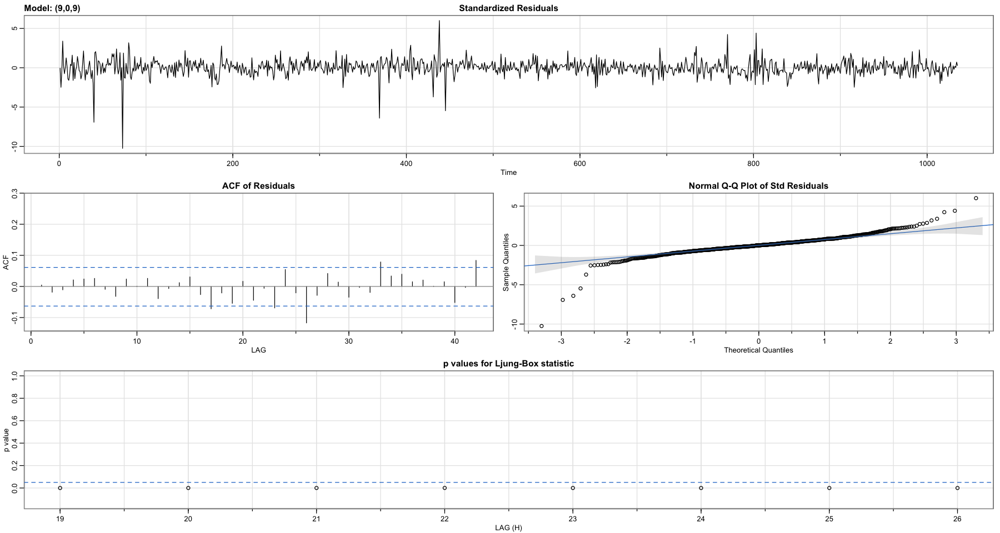

In [1771]:
set_plot_dimensions(15, 8)
mod1 = sarima(residualDF[['linear_residuals']], p=9, q=9, d=0)

In [1772]:
print(mod1$AIC)

[1] 22.55706


In [1773]:
mod1_coef = mod1$fit$coef
mod1$fit$coef

ar1           ar2           ar3           ar4           ar5 
 2.152216e-02  8.796007e-02  4.739193e-02  2.208199e-02  1.002188e-01 
          ar6           ar7           ar8           ar9           ma1 
 1.362191e-01  4.374867e-01  6.513229e-01 -5.230131e-01  4.171383e-01 
          ma2           ma3           ma4           ma5           ma6 
 1.478953e-01  3.326127e-02 -3.055714e-02 -1.183081e-01 -1.094568e-01 
          ma7           ma8           ma9         xmean 
-4.356384e-01 -8.238202e-01  1.409792e-01 -2.108987e+03

#### Predict using mode1 1

In [1774]:
resids_mod1 = rep(0, n)
mod1_arima_preds = trainData[['resid_365day_removed']]
residuals = trainData[['resid_365day_removed']]

for(i in c(10:n)) {
    ar_terms = sum(mod1_coef[1 : 9] * residuals[(i - 1) : (i - 9)])
    ma_terms = sum(mod1_coef[10 : 18] * resids_mod1[(i - 1): (i - 9)])
    mod1_arima_preds[i] = ar_terms + ma_terms + mod1_coef[19]
    
    resids_mod1[i] = residuals[i] - mod1_arima_preds[i]
}

RMSE of fitted residuals(MOD1): without adjusting 27848.66

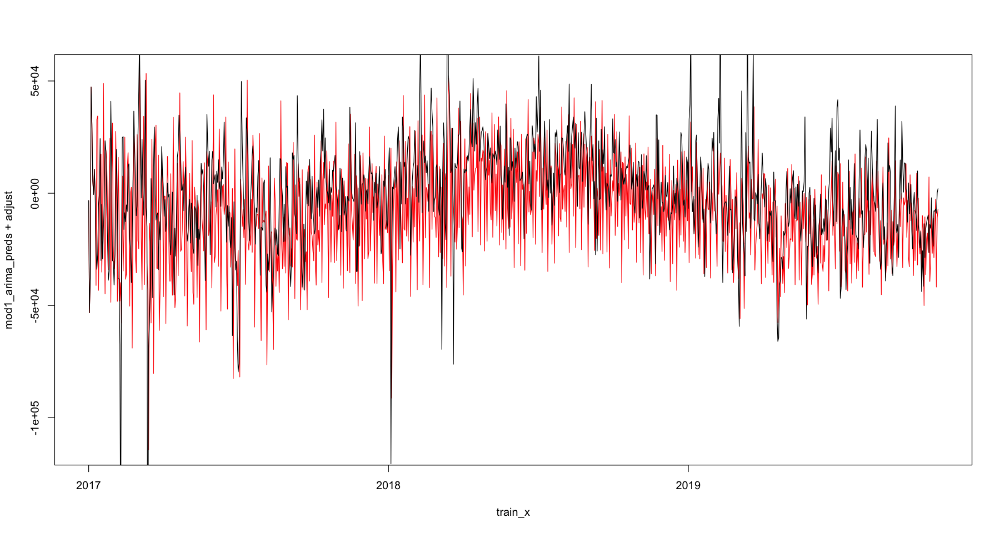

In [1775]:
## Plotting the final residuals and predictions of residuals
adjust = 0

plot(train_x, mod1_arima_preds + adjust, type="l", col="red") 
lines(train_x, residuals)

diff = mod1_arima_preds + adjust - residuals
cat("RMSE of fitted residuals(MOD1): without adjusting", sqrt(mean(diff^2)))

RMSE of fitted residuals(MOD1):  26458.46

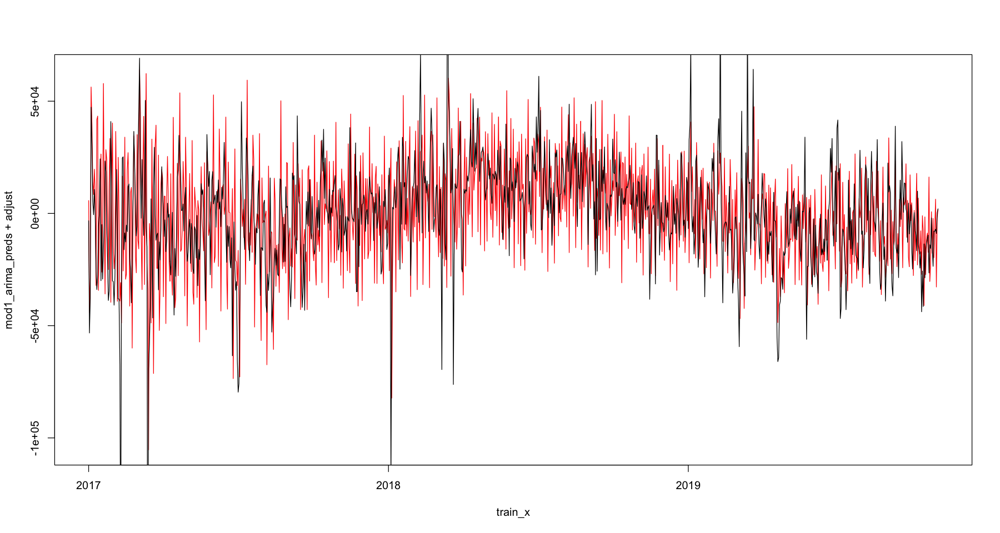

In [1776]:
## Plotting the final residuals and predictions of residuals
adjust = 9000

plot(train_x, mod1_arima_preds + adjust, type="l", col="red") 
lines(train_x, residuals)

diff = mod1_arima_preds + adjust - residuals
cat("RMSE of fitted residuals(MOD1): ", sqrt(mean(diff^2)))

In [1777]:
lm_coeff = lmfit$coefficients
lm_coeff

(Intercept) time(train_x) 
  547356.0058     -200.1376

In [1778]:
full_final_resid = full_y - (lm_coeff[1] + (lm_coeff[2] * time(full_x)))

In [1779]:
### Removing the different cyclic means
full_7 = rep(0, n_full)
full_30 = rep(0, n_full)
full_45 = rep(0, n_full)
full_182 = rep(0, n_full)
full_365 = rep(0, n_full)

In [1780]:
for(i in c(1: n_full)) {
    x = aug_data[i,]$weekday
    full_7[i] = resid_group_weekday[x,]$mean_per_weekday
    
    x = aug_data[i,]$labels_30
    full_30[i] = resid_group_30[x,]$mean_per_30
    
    x = aug_data[i,]$labels_45
    full_45[i] = resid_group_45[x,]$mean_per_45
    
    x = aug_data[i,]$labels_182
    full_182[i] = resid_group_182[x,]$mean_per_182
    
    x = aug_data[i,]$labels_365
    full_365[i] = resid_group_365[x,]$mean_per_365
}

In [1781]:
full_final_resid = full_final_resid - full_7 - full_30 - full_45 - full_182 - full_365

In [1782]:
## Fitting model 1 on full resids
resids_mod1_full = rep(0, n_full)
mod1_arima_preds_full = full_final_resid
residuals_full = full_final_resid

for(i in c(10:n_full)) {
    ar_terms = sum(mod1_coef[1 : 9] * residuals_full[(i - 1) : (i - 9)])
    ma_terms = sum(mod1_coef[10 : 18] * resids_mod1_full[(i - 1): (i - 9)])
    mod1_arima_preds_full[i] = ar_terms + ma_terms + mod1_coef[19]
    
    resids_mod1_full[i] = residuals_full[i] - mod1_arima_preds_full[i]
}

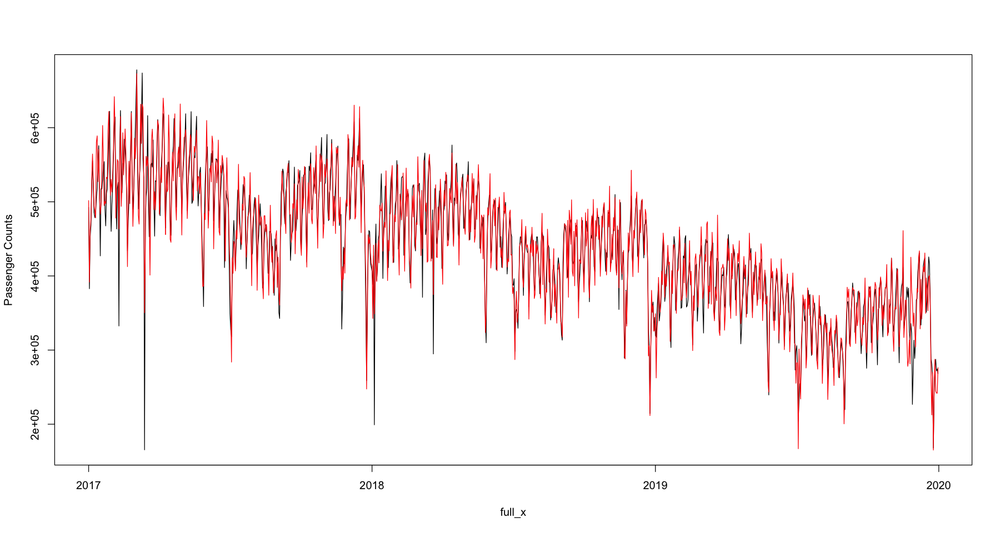

In [1783]:
## Adding back the trend and the means

x_full_pred = lm_coeff[1] + (lm_coeff[2] * time(full_x)) + mod1_arima_preds_full
x_full_pred = x_full_pred + full_7 + full_30 + full_45 + full_182 + full_365

plot(full_x, full_y, type="l", ylab = "Passenger Counts") 
lines(full_x, x_full_pred + adjust, col="red")

[1] 39954.88


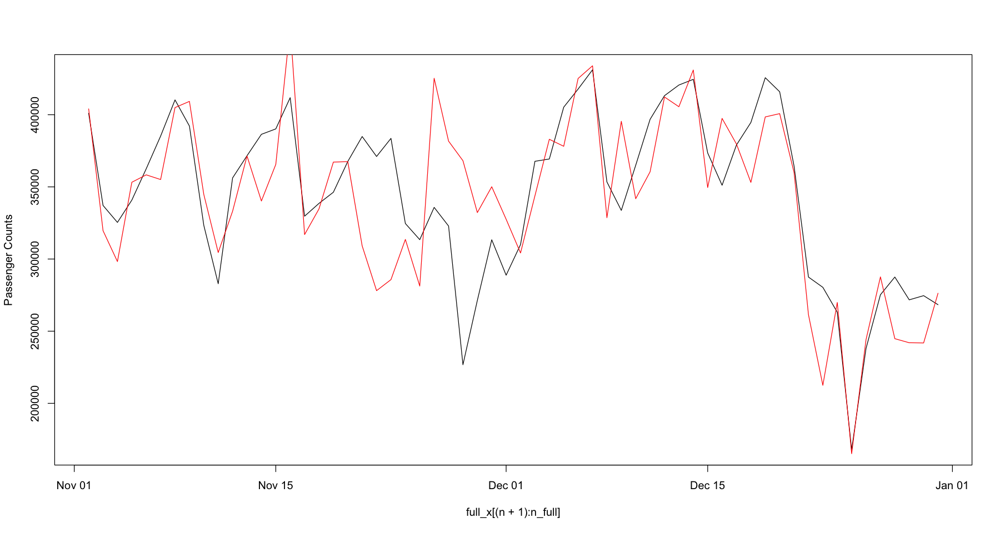

In [1784]:
## zoom in on the testing period and calculate RMSE 
plot(full_x[(n + 1) : n_full], full_y[(n + 1) : n_full], type="l", ylab = "Passenger Counts") 
lines(full_x[(n + 1) : n_full], x_full_pred[(n + 1) : n_full] + 9000, col="red")


diff = x_full_pred + adjust - full_y
print(sqrt(mean(diff[(n + 1): n_full]^2)))

### Second model ARMA (6, 4)

initial  value 10.066084 
iter   2 value 9.944397
iter   3 value 9.902526
iter   4 value 9.885946
iter   5 value 9.884147
iter   6 value 9.883441
iter   7 value 9.883077
iter   8 value 9.881738
iter   9 value 9.880388
iter  10 value 9.879439
iter  11 value 9.879075
iter  12 value 9.878980
iter  13 value 9.878801
iter  14 value 9.877301
iter  15 value 9.876723
iter  16 value 9.876015
iter  17 value 9.875876
iter  18 value 9.875508
iter  19 value 9.874507
iter  20 value 9.873559
iter  21 value 9.873060
iter  22 value 9.873034
iter  23 value 9.872800
iter  24 value 9.872773
iter  25 value 9.872770
iter  26 value 9.872749
iter  27 value 9.872643
iter  28 value 9.872598
iter  29 value 9.872446
iter  30 value 9.872141
iter  31 value 9.871853
iter  32 value 9.871693
iter  33 value 9.871632
iter  34 value 9.871606
iter  35 value 9.871582
iter  36 value 9.871495
iter  37 value 9.871270
iter  38 value 9.870495
iter  39 value 9.869864
iter  40 value 9.869594
iter  41 value 9.867641
iter  42 value

Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”
Warning message in sqrt(diag(fitit$var.coef)):
“NaNs produced”


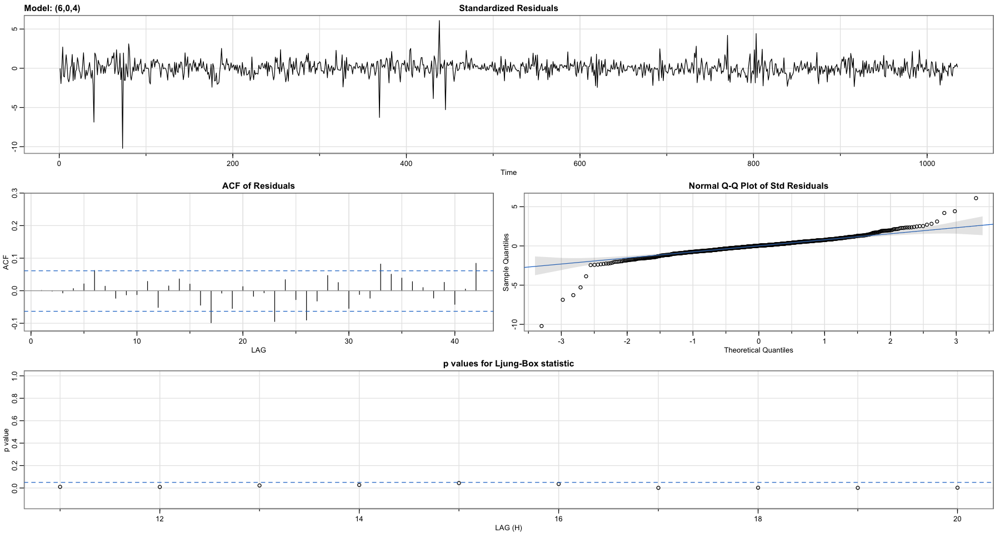

In [1785]:
set_plot_dimensions(15, 8)
mod2 = sarima(residualDF[['linear_residuals']], p=6, q=4, d=0)

In [1786]:
print(mod2$AIC)

[1] 22.56811


In [1787]:
mod2_coef = mod2$fit$coef
mod2$fit$coef

ar1           ar2           ar3           ar4           ar5 
 2.322149e+00 -2.322145e+00  9.732532e-01  1.189461e-01 -6.879143e-02 
          ar6           ma1           ma2           ma3           ma4 
-2.642246e-02 -1.889412e+00  1.533389e+00 -3.533799e-01 -2.645963e-01 
        xmean 
-1.621595e+03

#### Predict using mode1 2

In [1788]:
resids_mod2 = rep(0, n)
mod2_arima_preds = trainData[['resid_365day_removed']]
residuals = trainData[['resid_365day_removed']]

for(i in c(7:n)) {
    ar_terms = sum(mod2_coef[1 : 6] * residuals[(i - 1) : (i - 6)])
    ma_terms = sum(mod2_coef[7 : 10] * resids_mod2[(i - 1): (i - 4)])
    mod2_arima_preds[i] = ar_terms + ma_terms + mod2_coef[11]
    
    resids_mod2[i] = residuals[i] - mod2_arima_preds[i]
}

RMSE of fitted residuals(MOD2) without adjusting:  63430.52

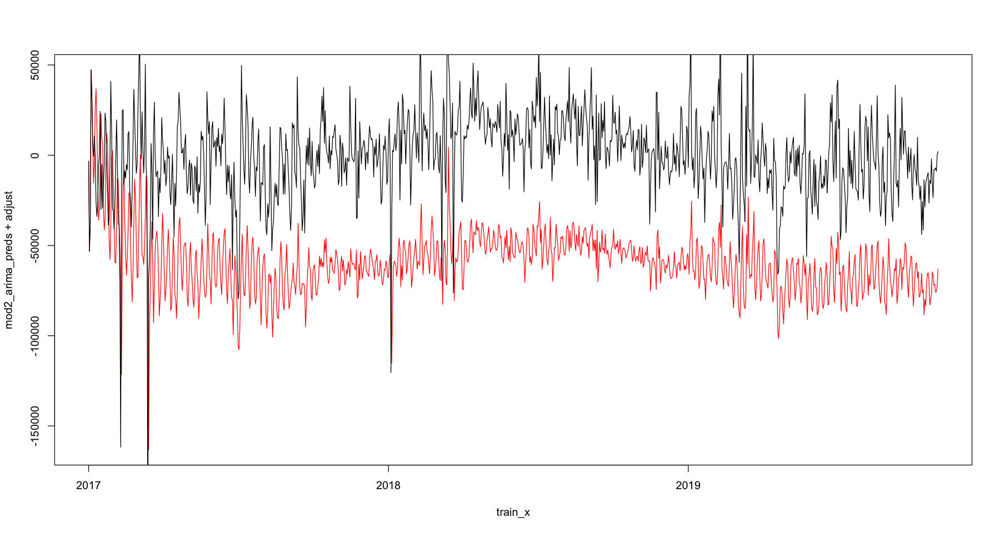

In [1789]:
## Plotting the final residuals and predictions of residuals

adjust = 0
plot(train_x, mod2_arima_preds + adjust, type="l", col="red")
lines(train_x, residuals)

diff = mod2_arima_preds + adjust - residuals
cat("RMSE of fitted residuals(MOD2) without adjusting: ", sqrt(mean(diff^2)))

RMSE of fitted residuals(MOD2):  23082.23

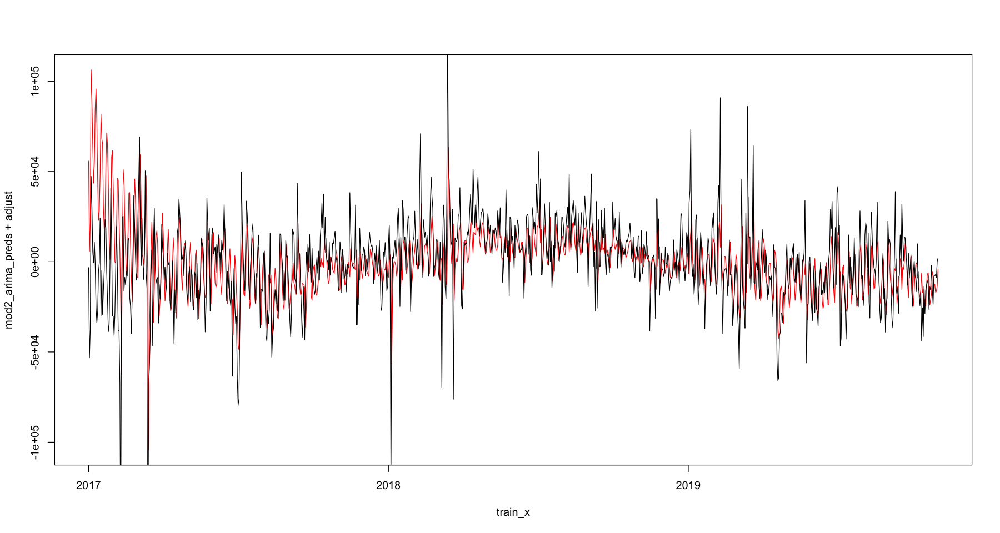

In [1790]:
## Plotting the final residuals and predictions of residuals

adjust = 59000
plot(train_x, mod2_arima_preds + adjust, type="l", col="red")
lines(train_x, residuals)

diff = mod2_arima_preds + adjust - residuals
cat("RMSE of fitted residuals(MOD2): ", sqrt(mean(diff^2)))

In [1791]:
full_final_resid = full_y - (lm_coeff[1] + (lm_coeff[2] * time(full_x)))

In [1792]:
full_final_resid = full_final_resid - full_7 - full_30 - full_45 - full_182 - full_365

In [1793]:
## Fitting model 1 on full resids
resids_mod2_full = rep(0, n_full)
mod2_arima_preds_full = full_final_resid
residuals_full = full_final_resid

for(i in c(7:n_full)) {
    ar_terms = sum(mod2_coef[1 : 6] * residuals_full[(i - 1) : (i - 6)])
    ma_terms = sum(mod2_coef[7 : 10] * resids_mod2_full[(i - 1): (i - 4)])
    mod2_arima_preds_full[i] = ar_terms + ma_terms + mod2_coef[11]
    
    resids_mod2_full[i] = residuals_full[i] - mod2_arima_preds_full[i]
}

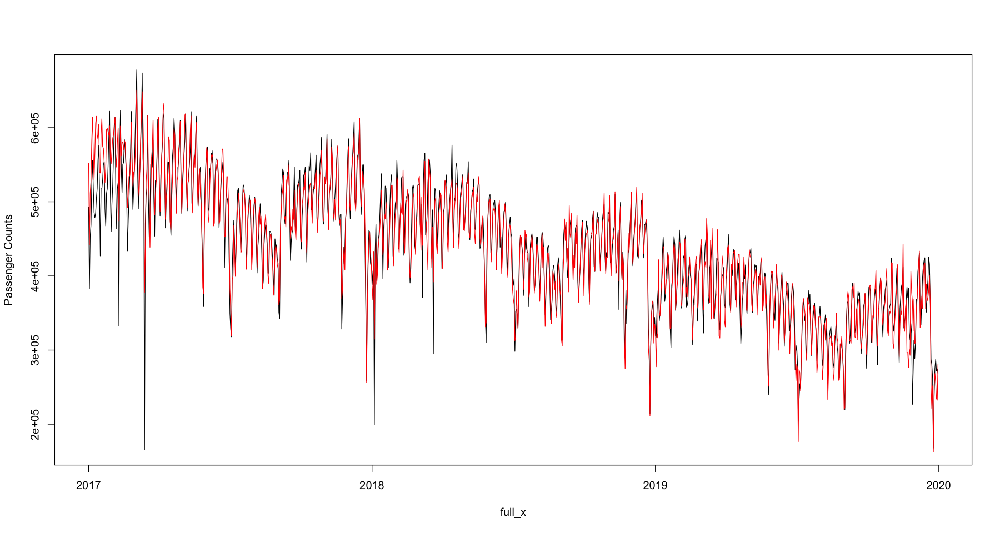

In [1794]:
## Adding back the trend and the means

x_full_pred = lm_coeff[1] + (lm_coeff[2] * time(full_x)) + mod2_arima_preds_full
x_full_pred = x_full_pred + full_7 + full_30 + full_45 + full_182 + full_365

plot(full_x, full_y, type="l", ylab = "Passenger Counts") 
lines(full_x, x_full_pred + adjust, col="red")

[1] 37890.48


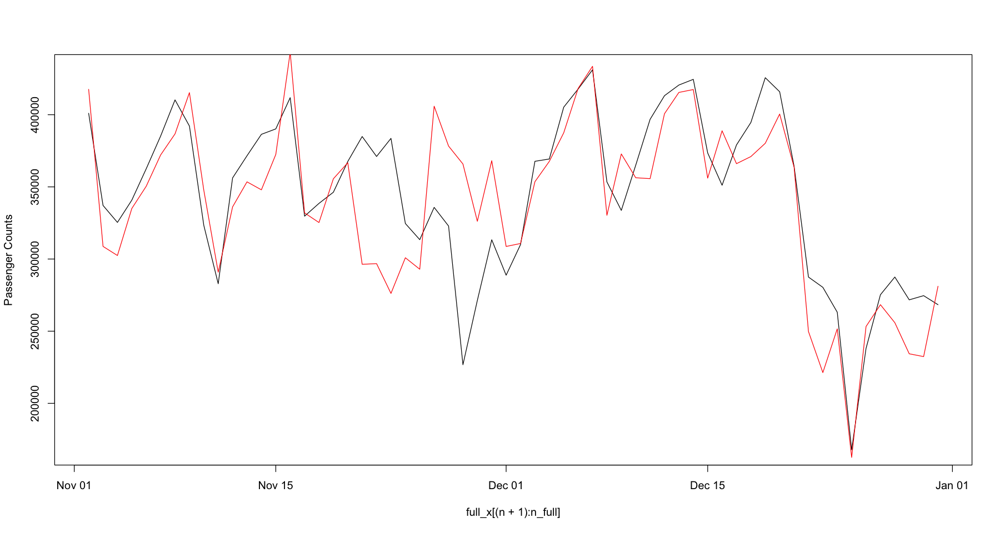

In [1795]:
## zoom in on the testing period and calculate RMSE 
plot(full_x[(n + 1) : n_full], full_y[(n + 1) : n_full], type="l", ylab = "Passenger Counts") 
lines(full_x[(n + 1) : n_full], (x_full_pred[(n + 1) : n_full] + adjust), col="red")


diff = x_full_pred + adjust - full_y
print(sqrt(mean(diff[(n + 1): n_full]^2)))

### Third model ARMA (1, 0)

initial  value 10.070196 
iter   2 value 9.912800
iter   2 value 9.912800
iter   2 value 9.912800
final  value 9.912800 
converged
initial  value 9.912478 
iter   2 value 9.912478
iter   2 value 9.912478
iter   2 value 9.912478
final  value 9.912478 
converged


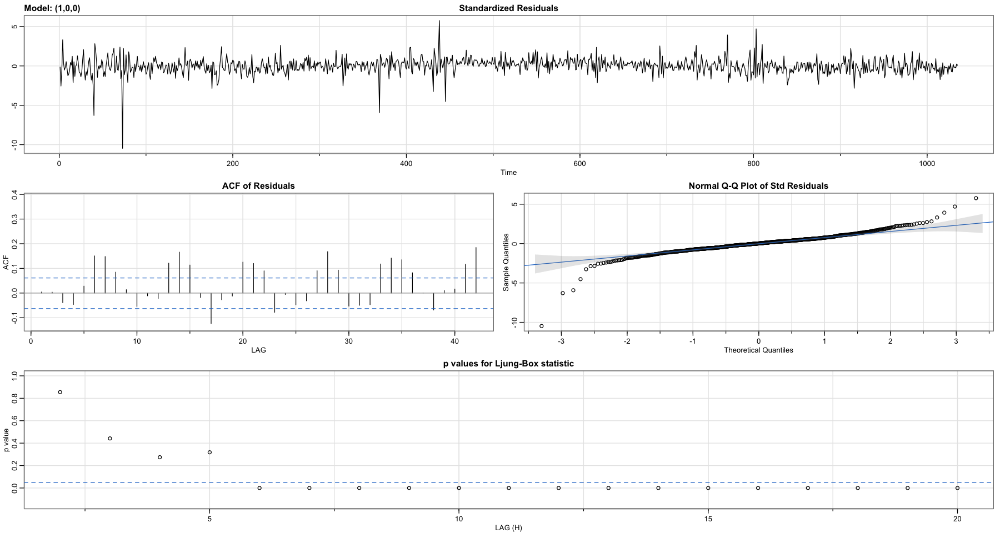

In [1796]:
set_plot_dimensions(15, 8)
mod3 = sarima(residualDF[['linear_residuals']], p=1, q=0, d=0)

In [1797]:
print(mod3$AIC)

[1] 22.66863


In [1798]:
mod3_coef = mod3$fit$coef
mod3$fit$coef

ar1     xmean 
0.5191765 0.6700537

In [1799]:
resids_mod3 = rep(0, n)
mod3_arima_preds = trainData[['resid_365day_removed']]
residuals = trainData[['resid_365day_removed']]

for(i in c(2:n)) {
    ar_terms = sum(mod3_coef[1] * residuals[(i - 1)])
    ma_terms = 0
    mod3_arima_preds[i] = ar_terms + ma_terms + mod3_coef[2]
    
    resids_mod3[i] = residuals[i] - mod3_arima_preds[i]
}

RMSE of fitted residuals(MOD3) without adjusting:  20177.38

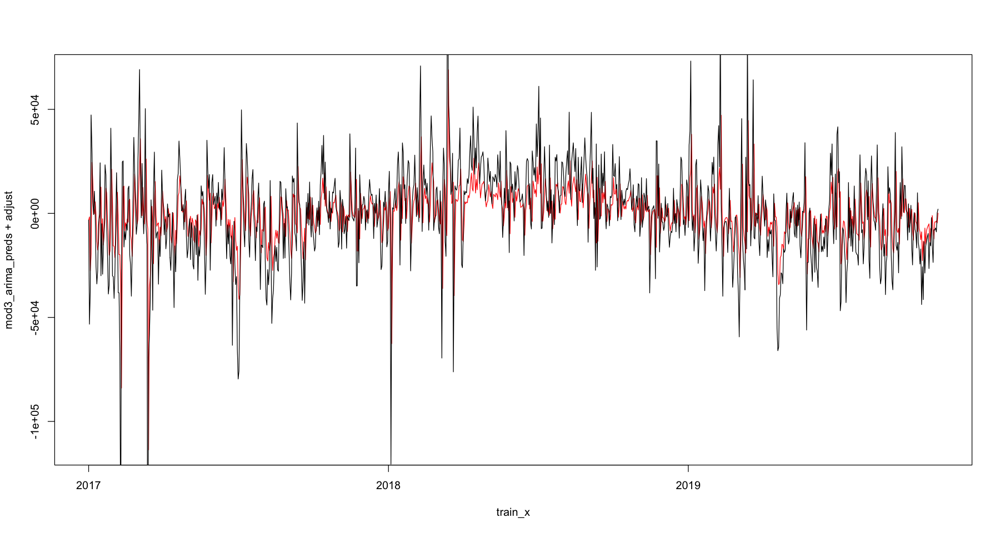

In [1800]:
## Plotting the final residuals and predictions of residuals
adjust = 0
plot(train_x, mod3_arima_preds + adjust, type="l", col="red")
lines(train_x, residuals)

diff = mod3_arima_preds - residuals + adjust
cat("RMSE of fitted residuals(MOD3) without adjusting: ", sqrt(mean(diff^2)))

RMSE of fitted residuals(MOD3):  20177.38

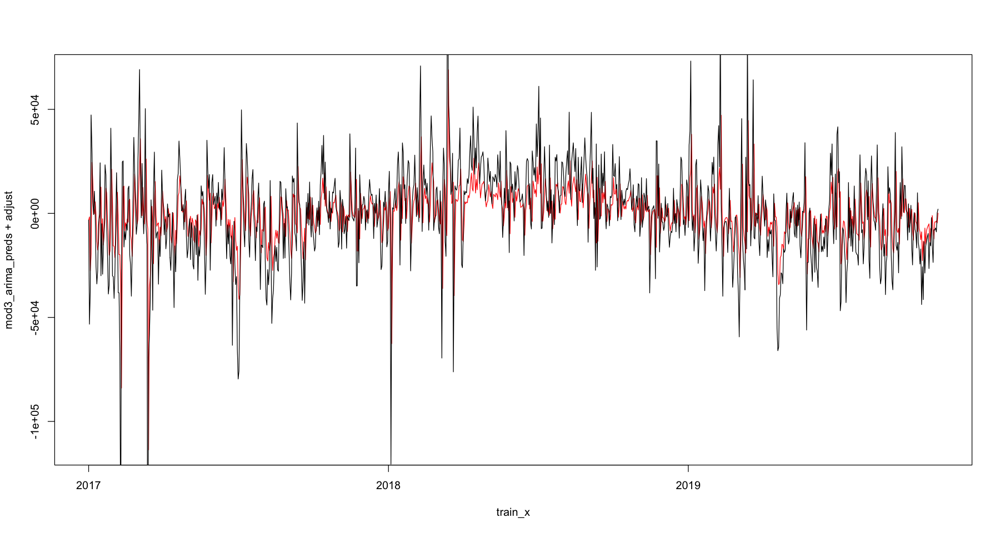

In [1810]:
## Plotting the final residuals and predictions of residuals
adjust = 0
plot(train_x, mod3_arima_preds + adjust, type="l", col="red")
lines(train_x, residuals)

diff = mod3_arima_preds - residuals + adjust
cat("RMSE of fitted residuals(MOD3): ", sqrt(mean(diff^2)))

In [1811]:
full_final_resid = full_y - (lm_coeff[1] + (lm_coeff[2] * time(full_x)))
full_final_resid = full_final_resid - full_7 - full_30 - full_45 - full_182 - full_365

In [1815]:
## Fitting model 1 on full resids
resids_mod3_full = rep(0, n_full)
mod3_arima_preds_full = full_final_resid
residuals_full = full_final_resid

for(i in c(2:n_full)) {
    ar_terms = sum(mod3_coef[1] * residuals_full[(i - 1)])
    ma_terms = 0
    mod3_arima_preds_full[i] = ar_terms + ma_terms + mod3_coef[2]
    
    resids_mod3_full[i] = residuals_full[i] - mod3_arima_preds_full[i]
}

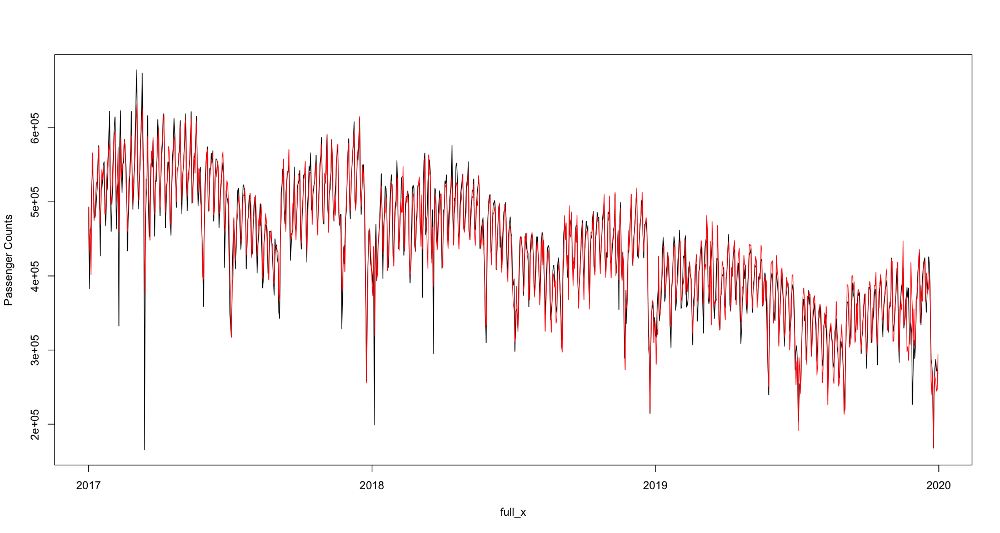

In [1816]:
## Adding back the trend and the means

x_full_pred = lm_coeff[1] + (lm_coeff[2] * time(full_x)) + mod3_arima_preds_full
x_full_pred = x_full_pred + full_7 + full_30 + full_45 + full_182 + full_365

plot(full_x, full_y, type="l", ylab = "Passenger Counts") 
lines(full_x, x_full_pred, col="red")

[1] 34880.39


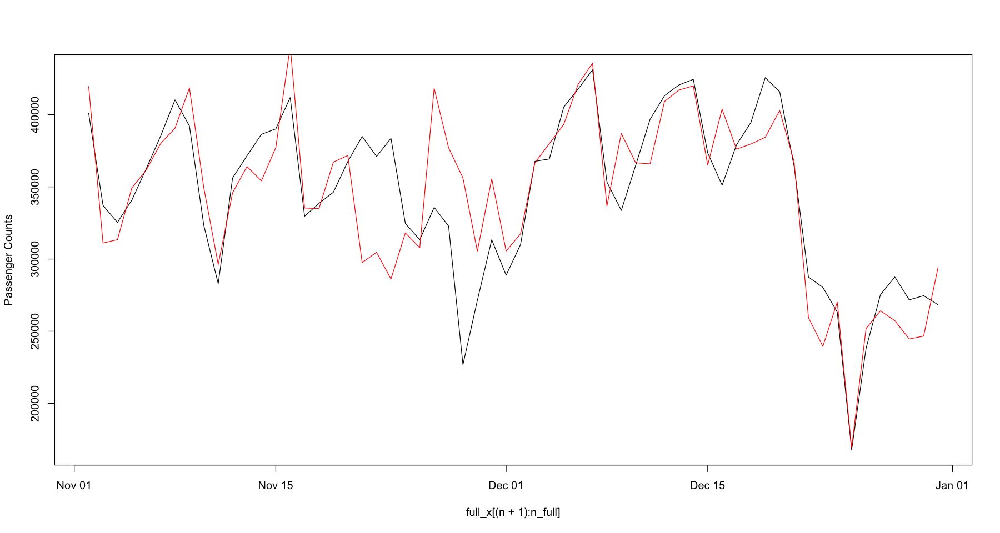

In [1817]:
## zoom in on the testing period and calculate RMSE 
plot(full_x[(n + 1) : n_full], full_y[(n + 1) : n_full], type="l", ylab = "Passenger Counts") 
lines(full_x[(n + 1) : n_full], (x_full_pred[(n + 1) : n_full]), col="red")


diff = x_full_pred - full_y
print(sqrt(mean(diff[(n + 1): n_full]^2)))

### Compare with simple models

In [1818]:
rms  = function(x) sqrt(mean(x^2))

In [1819]:
rms(full_y[(n + 1): n_full] - mean(train_y))

[1] 113420.6

In [1820]:
rms(full_y[(n+1) : n_full] - (lm_coeff[1] + (lm_coeff[2] * (time(full_x)[(n + 1) : n_full]))))

[1] 56739.59

In [1821]:
rms(full_y[(n + 1) : n_full] - (lm_coeff[1] + (lm_coeff[2] * time(full_x)[(n + 1) : n_full]) + full_7[(n + 1) : n_full]))


[1] 52615.38

In [1822]:
rms(full_y[(n + 1) : n_full] - full_y[n : (n_full - 1)])

[1] 38643.51

initial  value 10.908310 
iter   2 value 10.633007
iter   3 value 10.633006
iter   4 value 10.633006
iter   5 value 10.633006
iter   6 value 10.633005
iter   7 value 10.633004
iter   8 value 10.633004
iter   8 value 10.633004
iter   8 value 10.633004
final  value 10.633004 
converged
initial  value 10.633270 
iter   1 value 10.633270
final  value 10.633270 
converged


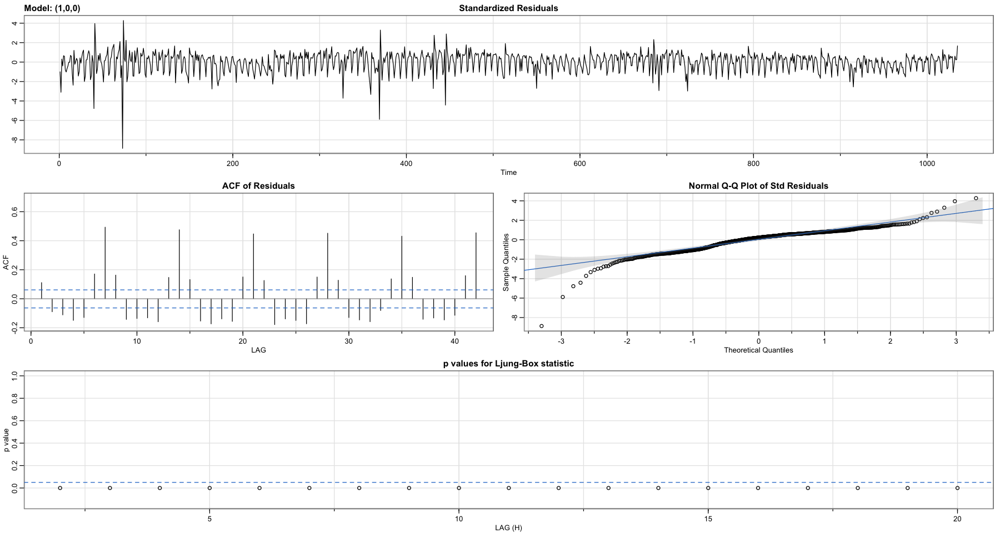

In [1823]:
### Use simple AR(1)

set_plot_dimensions(15, 8)
base = sarima(linear_residuals, p=1, q=0, d=0)

In [1824]:
base_coef = base$fit$coef
base$fit$coef

ar1     xmean 
  0.65107 113.70016

In [1825]:
full_linear_resids = full_y - (lm_coeff[1] + lm_coeff[2] * time(full_x))

In [1826]:
## Fitting model 1 on full resids
resids_base_full = rep(0, n_full)
base_arima_preds_full = full_linear_resids
residuals_full = full_linear_resids

for(i in c(2: n_full)) {
    ar_terms = sum(base_coef[1] * residuals_full[(i - 1)])
    ma_terms = 0
    base_arima_preds_full[i] = ar_terms + ma_terms + base_coef[2]
    
    resids_base_full[i] = residuals_full[i] - base_arima_preds_full[i]
}

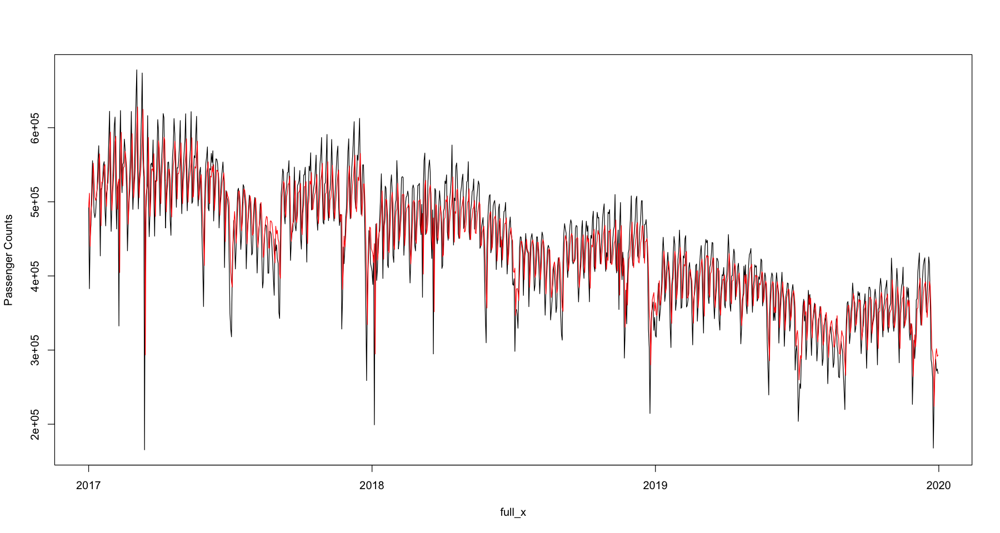

In [1827]:
## Adding back the trend and the means

x_full_pred = lm_coeff[1] + (lm_coeff[2] * time(full_x)) + base_arima_preds_full

plot(full_x, full_y, type="l", ylab = "Passenger Counts") 
lines(full_x, x_full_pred, col="red")

[1] 36742.08


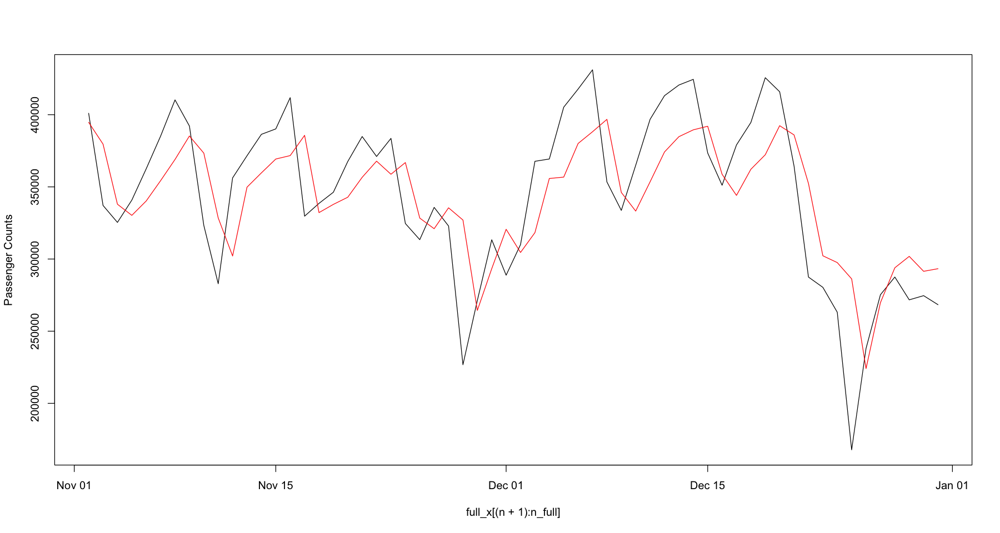

In [1833]:
## zoom in on the testing period and calculate RMSE 
adjust = 0
plot(full_x[(n + 1) : n_full], full_y[(n + 1) : n_full], type="l", ylab = "Passenger Counts") 
lines(full_x[(n + 1) : n_full], (x_full_pred[(n + 1) : n_full] + adjust), col="red")


diff = x_full_pred + adjust - full_y
print(sqrt(mean(diff[(n + 1): n_full]^2)))